<h1 style="text-align: center; font-size: 36px; line-height: 1.5em;">
    <font color='#00A6D6'>MOTOR INSURANCE CLAIM PREDICTION USING ML</font>
</h1>


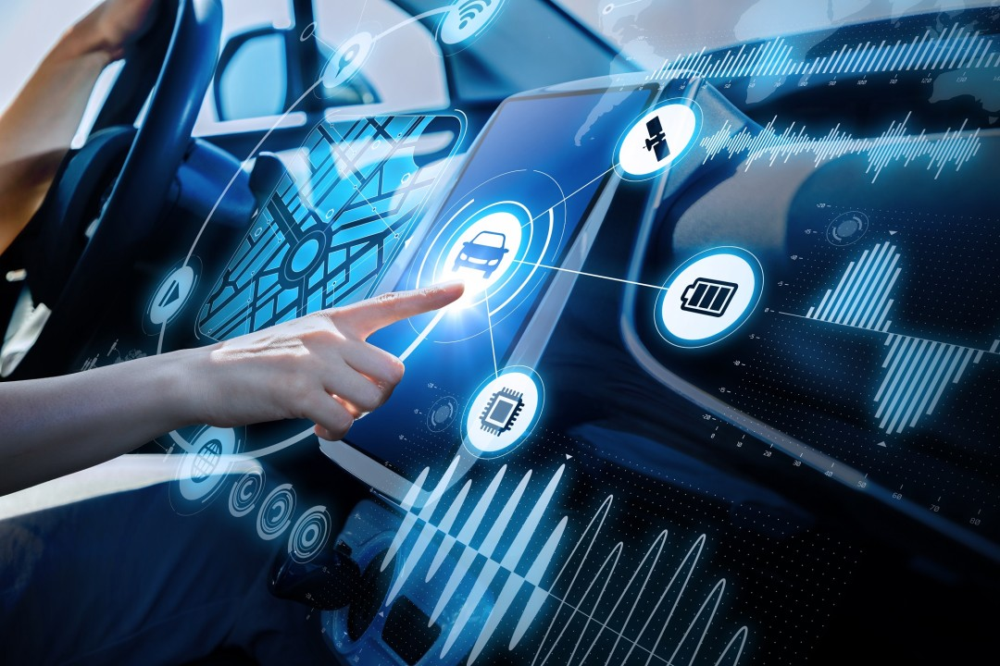

## Abstract:
>### The goal of this project is to develop a machine learning model that predicts the claim amount for Motor insurance based on various features. By accurately estimating the claim amount, insurance companies can better manage their risk and make informed decisions.

## Content:
>### The problem addressed is predicting the claim amount for Motor Insurance using machine learning algorithms. The aim is to build a model that accurately predicts the claim amount based on various customer and policy-related features. The model should be able to analyze the given features and provide an estimation of the expected claim amount for an insurance policy.

## Study of Existing Systems:
>### An analysis of existing systems for Motor Insurance claim prediction reveals that traditional methods often rely on manual assessment and expert judgment, leading to subjective and potentially inaccurate claim estimations. There is a need for a data-driven approach that leverages machine learning techniques to improve the accuracy and efficiency of claim amount predictions.

## Identification of Gaps in Existing Systems:
>### Existing systems lack the ability to quantitatively estimate the claim amount based on various factors and features associated with the customer and policy. The reliance on manual assessment introduces subjectivity and inconsistency in claim estimations. Additionally, traditional methods may not effectively capture the complex relationships and patterns within the data, resulting in suboptimal predictions.

## Proposed Solution:
>### The proposed solution involves developing a machine learning model that utilizes the available features such as customer demographics, policy details, and historical claim data to predict the claim amount accurately. By leveraging advanced algorithms and techniques, the model aims to uncover patterns, relationships, and dependencies within the data to make reliable predictions.

## Main Objective:
>### The main objective of this project is to build a robust and accurate machine learning model that can predict the claim amount for Motor Insurance policies. By accurately estimating the claim amount, insurance companies can better manage their claims processing, assess risk, and allocate resources effectively.

## Data Description:
The dataset used in this project consists of historical data related to Motor insurance claims. It contains information about different features such as the policy holder's vehicle information, policy details, and previous claim history. The target variable is the claim amount, which represents the monetary value of the insurance claim.

>## Features:
> The features used for predicting the claim amount include:
> Customer-related features:

- Customer: The "Customer" column represents the unique ID of each customer in the dataset.
- Country: The country where the customer is located.
- State Code: The code representing the state where the customer resides.
- State: The state where the customer is located.
- Education: The educational background of the customer.
- EmploymentStatus: The employment status of the customer.
- Gender: The gender of the customer.
- Income: The annual income of the customer.
- Marital Status: The marital status of the customer.

> Policy-related features:
- Response: The "Response" column in the dataset refers to whether the customer is satisfied with the claim amount or not
- Coverage: The type of coverage provided by the insurance policy.
- Location Code: The code representing the location of the insured vehicle.
- Monthly Premium Auto: The monthly premium amount paid by the customer.
- Months Since Last Claim: The number of months since the last insurance claim was made.
- Months Since Policy Inception: The number of months since the policy was initiated.
- Number of Open Complaints: The number of open complaints registered by the customer.
- Number of Policies: The number of insurance policies held by the customer.
- Policy Type: The type of insurance policy.
- Policy: The specific policy identifier.
- Claim Reason: The "Claim Reason" variable refers to the reason or cause behind the insurance claim.
- Sales Channel: The channel through which the insurance policy was sold.
- Total Claim Amount: The "Total Claim Amount" variable refers to the total amount claimed by the customer in their insurance claim.
- Vehicle Class: The class of the insured vehicle.
- Vehicle Size: The size category of the insured vehicle.

>## Target Variable:
- The target variable for the prediction task is the 'Claim Amount'. The model will be trained to estimate the claim amount based on the given features.

## Library Used:

>#### The project will make use of the following Python libraries:


- Numpy : for numerical computing (https://numpy.org/doc/stable/reference/?v=20230420065146)

- Pandas: for data manipulation and analysis (https://pandas.pydata.org/pandas-docs/stable/?v=20230420065146)

- Matplotlib and Seaborn: for data visualization (https://matplotlib.org/stable/users/index.html ,https://seaborn.pydata.org/#:~:text=Seaborn%20is%20a%20Python%20data,attractive%20and%20informative%20statistical%20graphics)

- Sklearn: It is a popular machine learning library in Python that provides a wide range of tools for data preprocessing, feature selection, model training, and model evaluation.(https://scikit-learn.org/stable/)

- Train_test_split:It is used to split the dataset into training and testing subsets for model evaluation.

- cross_val_score: It calculates the cross-validated scores for a given model and dataset.

- GridSearchCV: It performs an exhaustive search over specified parameter values for an estimator and finds the best parameters using cross-validation.

- Mean_squared_error: It calculates the mean squared error between the actual and predicted values.

- Mean_absolute_error: It calculates the mean absolute error between the actual and predicted values.

- r2_score: It computes the coefficient of determination (R-squared) for regression models.

- LabelEncoder: It is used to encode categorical variables into numerical labels.

- LinearRegression: It is a linear regression model used to fit a linear relationship between the dependent variable and one or more independent variables.

- DecisionTreeRegressor: It is a regression model based on decision tree algorithms.

- RandomForestRegressor: It is an ensemble model that uses multiple decision trees for regression.

- KNeighborsRegressor: It is a regression model that predicts the target variable based on the k nearest neighbors in the feature space.

- SVR: It is a support vector machine model for regression tasks.

- StandardScaler: It is used to standardize the features by removing the mean and scaling to unit variance.

In [1]:
# Importing the required libraries and modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

# Importing warnings to suppress while execution
import warnings
warnings.filterwarnings('ignore')

## 📖 Reading the Dataset

>#### Source : [Github](https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects)
Below code reads the dataset from a CSV file and creates a Pandas DataFrame.

In [2]:
# Accessing the dataset and creating the dataframe
claim = pd.read_csv('Auto_Insurance_Claims_amount.csv')

>## Data Preprocessing:
To prepare the data for modeling, several preprocessing steps were performed. Unnecessary columns, including customer information, country, state, and effective dates, were dropped as they were deemed irrelevant for the prediction task. The dataset was checked for missing values, and a heatmap visualization was used to identify any patterns of missingness. Categorical columns were encoded using LabelEncoder to convert them into numerical representations. Skewness in numeric columns was addressed by applying a log transformation to normalize the data.

From the above data,we observe that Customer column has unique id for each columns,country columns has only one data throughout the dataset,state & state code column has same data and effective to date is not necessary as we have month data,so lets drop these three columns to reduce complexity

In [3]:
claim

,Customer,Country,State Code,State,Claim Amount,Response,Coverage,Education,Effective To Date,EmploymentStatus,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Claim Reason,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,US,KS,Kansas,276.351928,No,Basic,Bachelor,2/24/11,Employed,...,5,0,1,Corporate Auto,Corporate L3,Collision,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,US,NE,Nebraska,697.953590,No,Extended,Bachelor,1/31/11,Unemployed,...,42,0,8,Personal Auto,Personal L3,Scratch/Dent,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,US,OK,Oklahoma,1288.743165,No,Premium,Bachelor,2/19/11,Employed,...,38,0,2,Personal Auto,Personal L3,Collision,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,US,MO,Missouri,764.586183,No,Basic,Bachelor,1/20/11,Unemployed,...,65,0,7,Corporate Auto,Corporate L2,Collision,Call Center,529.881344,SUV,Medsize
4,HB64268,US,KS,Kansas,281.369258,No,Basic,Bachelor,2/3/11,Employed,...,44,0,1,Personal Auto,Personal L1,Collision,Agent,138.130879,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,US,MO,Missouri,2340.598798,No,Basic,Bachelor,2/10/11,Employed,...,89,0,2,Personal Auto,Personal L1,Hail,Web,198.234764,Four-Door Car,Medsize
9130,PK87824,US,MO,Missouri,309.651122,Yes,Extended,College,2/12/11,Employed,...,28,0,1,Corporate Auto,Corporate L3,Collision,Branch,379.200000,Four-Door Car,Medsize
9131,TD14365,US,MO,Missouri,816.389043,No,Extended,Bachelor,2/6/11,Unemployed,...,37,3,2,Corporate Auto,Corporate L2,Collision,Branch,790.784983,Four-Door Car,Medsize
9132,UP19263,US,MO,Missouri,752.444244,No,Extended,College,2/3/11,Employed,...,3,0,3,Personal Auto,Personal L2,Scratch/Dent,Branch,691.200000,Four-Door Car,Large


#### To retrieve the column names of the claim DataFrame, We can use the columns attribute

In [4]:
claim.columns

Index(['Customer', 'Country', 'State Code', 'State', 'Claim Amount',
       'Response', 'Coverage', 'Education', 'Effective To Date',
       'EmploymentStatus', 'Gender', 'Income', 'Location Code',
       'Marital Status', 'Monthly Premium Auto', 'Months Since Last Claim',
       'Months Since Policy Inception', 'Number of Open Complaints',
       'Number of Policies', 'Policy Type', 'Policy', 'Claim Reason',
       'Sales Channel', 'Total Claim Amount', 'Vehicle Class', 'Vehicle Size'],
      dtype='object')

In [5]:
claim.drop(['Customer','Country','State Code','Education', 'Effective To Date',
                   'EmploymentStatus', 'Location Code', 'Marital Status','Sales Channel'],axis=1,inplace=True)

In [6]:
claim

,State,Claim Amount,Response,Coverage,Gender,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Claim Reason,Total Claim Amount,Vehicle Class,Vehicle Size
0,Kansas,276.351928,No,Basic,F,56274,69,32,5,0,1,Corporate Auto,Corporate L3,Collision,384.811147,Two-Door Car,Medsize
1,Nebraska,697.953590,No,Extended,F,0,94,13,42,0,8,Personal Auto,Personal L3,Scratch/Dent,1131.464935,Four-Door Car,Medsize
2,Oklahoma,1288.743165,No,Premium,F,48767,108,18,38,0,2,Personal Auto,Personal L3,Collision,566.472247,Two-Door Car,Medsize
3,Missouri,764.586183,No,Basic,M,0,106,18,65,0,7,Corporate Auto,Corporate L2,Collision,529.881344,SUV,Medsize
4,Kansas,281.369258,No,Basic,M,43836,73,12,44,0,1,Personal Auto,Personal L1,Collision,138.130879,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,Missouri,2340.598798,No,Basic,M,71941,73,18,89,0,2,Personal Auto,Personal L1,Hail,198.234764,Four-Door Car,Medsize
9130,Missouri,309.651122,Yes,Extended,F,21604,79,14,28,0,1,Corporate Auto,Corporate L3,Collision,379.200000,Four-Door Car,Medsize
9131,Missouri,816.389043,No,Extended,M,0,85,9,37,3,2,Corporate Auto,Corporate L2,Collision,790.784983,Four-Door Car,Medsize
9132,Missouri,752.444244,No,Extended,M,21941,96,34,3,0,3,Personal Auto,Personal L2,Scratch/Dent,691.200000,Four-Door Car,Large


In [7]:
claim.head()

,State,Claim Amount,Response,Coverage,Gender,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Claim Reason,Total Claim Amount,Vehicle Class,Vehicle Size
0,Kansas,276.351928,No,Basic,F,56274,69,32,5,0,1,Corporate Auto,Corporate L3,Collision,384.811147,Two-Door Car,Medsize
1,Nebraska,697.953590,No,Extended,F,0,94,13,42,0,8,Personal Auto,Personal L3,Scratch/Dent,1131.464935,Four-Door Car,Medsize
2,Oklahoma,1288.743165,No,Premium,F,48767,108,18,38,0,2,Personal Auto,Personal L3,Collision,566.472247,Two-Door Car,Medsize
3,Missouri,764.586183,No,Basic,M,0,106,18,65,0,7,Corporate Auto,Corporate L2,Collision,529.881344,SUV,Medsize
4,Kansas,281.369258,No,Basic,M,43836,73,12,44,0,1,Personal Auto,Personal L1,Collision,138.130879,Four-Door Car,Medsize


In [8]:
claim.tail()

,State,Claim Amount,Response,Coverage,Gender,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Claim Reason,Total Claim Amount,Vehicle Class,Vehicle Size
9129,Missouri,2340.598798,No,Basic,M,71941,73,18,89,0,2,Personal Auto,Personal L1,Hail,198.234764,Four-Door Car,Medsize
9130,Missouri,309.651122,Yes,Extended,F,21604,79,14,28,0,1,Corporate Auto,Corporate L3,Collision,379.200000,Four-Door Car,Medsize
9131,Missouri,816.389043,No,Extended,M,0,85,9,37,3,2,Corporate Auto,Corporate L2,Collision,790.784983,Four-Door Car,Medsize
9132,Missouri,752.444244,No,Extended,M,21941,96,34,3,0,3,Personal Auto,Personal L2,Scratch/Dent,691.200000,Four-Door Car,Large
9133,Missouri,261.183687,No,Extended,M,0,77,3,90,0,1,Corporate Auto,Corporate L3,Other,369.600000,Two-Door Car,Medsize


In [9]:
#lets see the shapeof dataset
claim.shape

(9134, 17)

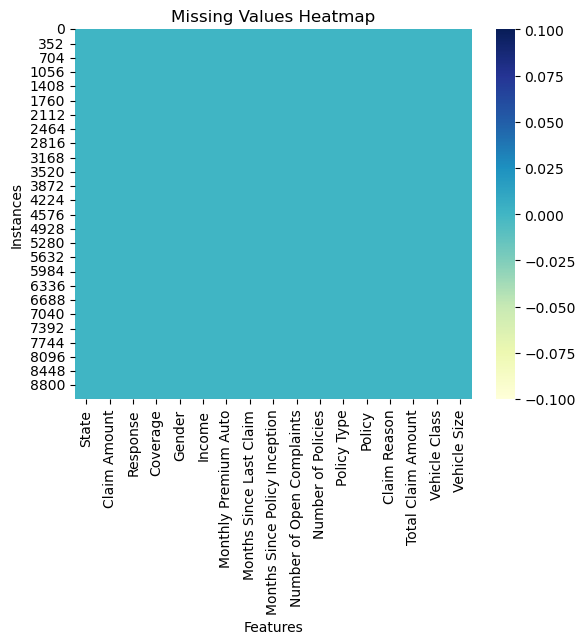

In [10]:
#checking for any null values
sns.heatmap(claim.isnull(), cmap='YlGnBu')
# Set the title and axis labels
plt.title('Missing Values Heatmap')
plt.xlabel('Features')
plt.ylabel('Instances')
plt.show()
#It seems there is no null data in the dataset

In [11]:
claim.isnull().sum()

State                            0
Claim Amount                     0
Response                         0
Coverage                         0
Gender                           0
Income                           0
Monthly Premium Auto             0
Months Since Last Claim          0
Months Since Policy Inception    0
Number of Open Complaints        0
Number of Policies               0
Policy Type                      0
Policy                           0
Claim Reason                     0
Total Claim Amount               0
Vehicle Class                    0
Vehicle Size                     0
dtype: int64

In [12]:
claim.duplicated().sum()

163

In [13]:
claim.drop_duplicates(inplace=True)

In [14]:
claim.duplicated().sum()

0

In [15]:
claim.shape

(8971, 17)

### Outlier Treatment

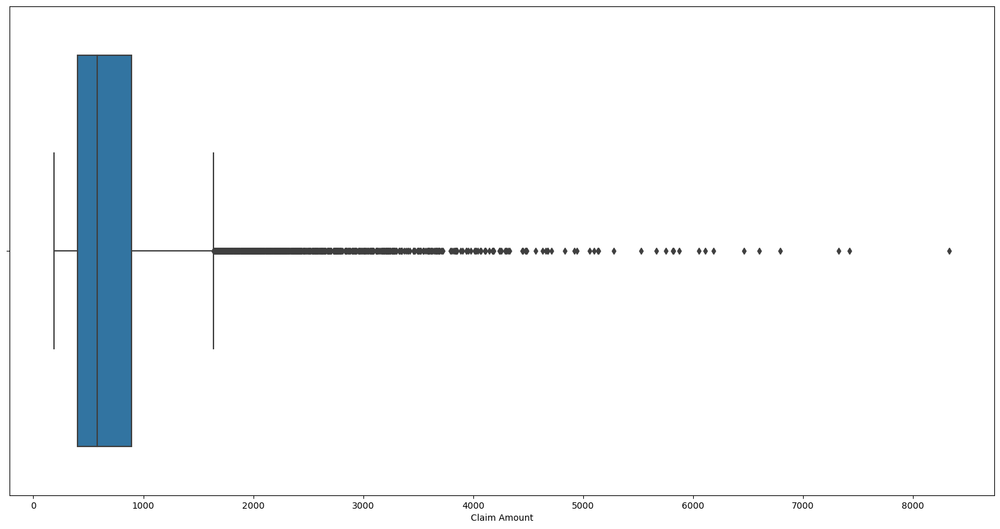

In [16]:
plt.figure(figsize=(20,10))
sns.boxplot(data=claim, x='Claim Amount')
plt.show()

In [17]:
claim_outliers=claim[claim['Claim Amount']>=1443.274644]
claim_outliers.shape

(1021, 17)

In [18]:
claim=claim[~(claim['Claim Amount']>=1443.274644)]

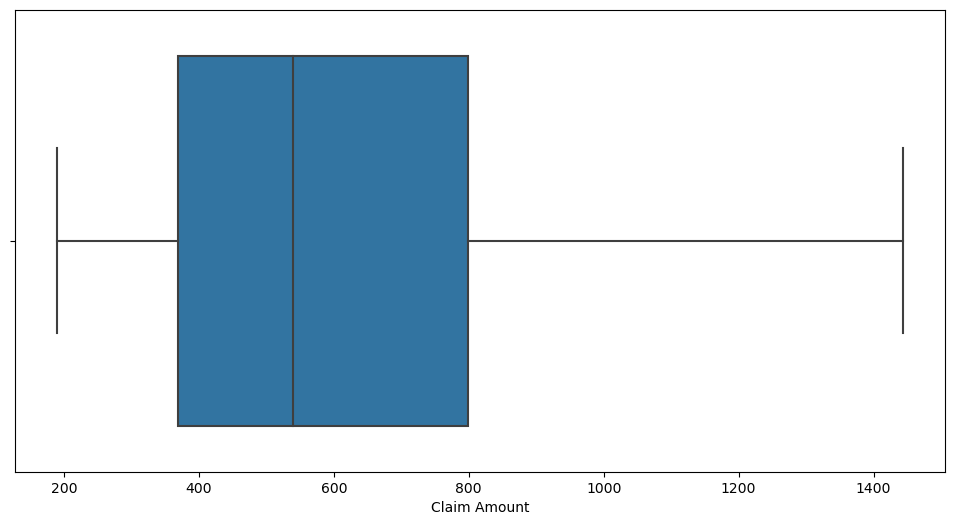

In [19]:
plt.figure(figsize=(12,6))
sns.boxplot(data=claim, x='Claim Amount')
plt.show()

In [20]:
claim.shape

(7950, 17)

In [21]:
#Lets check for the datatype of each column
claim.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7950 entries, 0 to 9133
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   State                          7950 non-null   object 
 1   Claim Amount                   7950 non-null   float64
 2   Response                       7950 non-null   object 
 3   Coverage                       7950 non-null   object 
 4   Gender                         7950 non-null   object 
 5   Income                         7950 non-null   int64  
 6   Monthly Premium Auto           7950 non-null   int64  
 7   Months Since Last Claim        7950 non-null   int64  
 8   Months Since Policy Inception  7950 non-null   int64  
 9   Number of Open Complaints      7950 non-null   int64  
 10  Number of Policies             7950 non-null   int64  
 11  Policy Type                    7950 non-null   object 
 12  Policy                         7950 non-null   o

>## Exploratory Data Analysis:
During the exploratory data analysis phase, several key insights were obtained. Visualizations and statistical summaries were used to understand the distribution of variables, identify any outliers, and explore relationships between features and the claim amount. It was observed that certain features, such as the policy holder's age and vehicle age, had a noticeable impact on the claim amount.

Data Visualisation

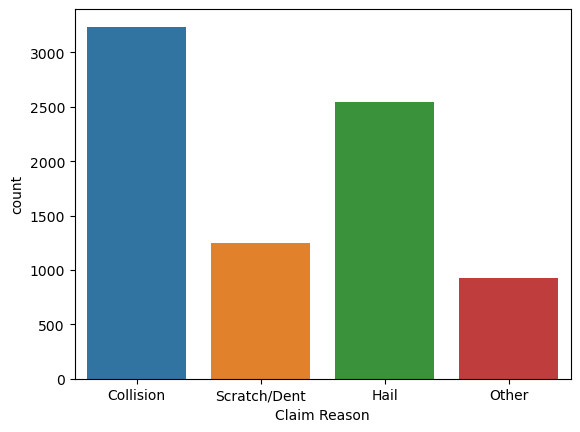

In [22]:
#Lets check the countplot of claim reasons
sns.countplot(claim['Claim Reason']) #To visualize the count or frequency of different categories in a categorical variable
plt.show()

>### Observation:
    The observation from the countplot is that the 'Claim Reason' category "collision" has the highest count or frequency compared to other categories. This means that the most common reason for insurance claims in the dataset is related to collisions.

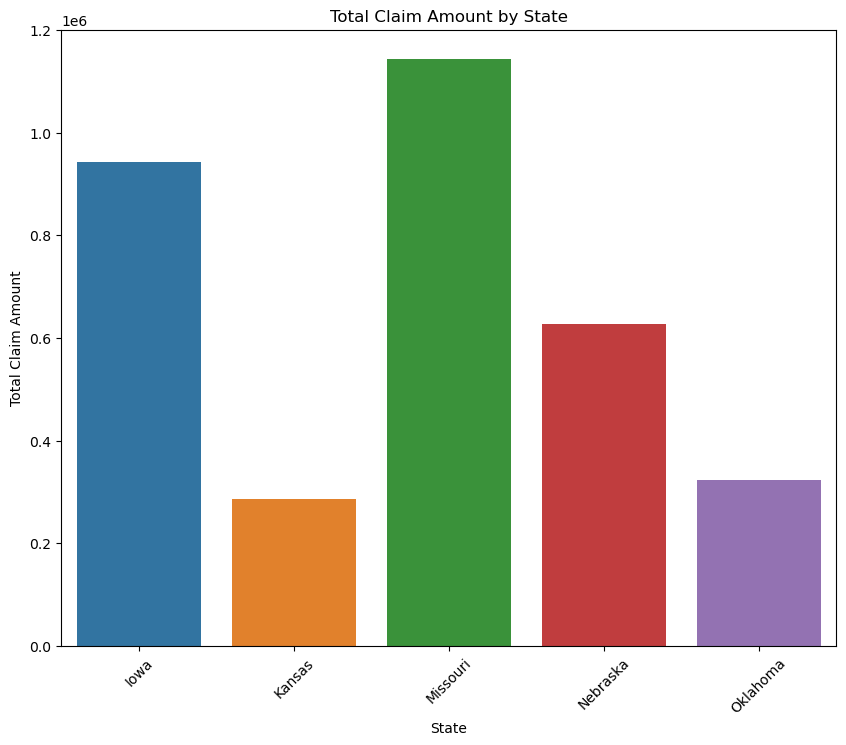

In [23]:
# Aggregate the total claim amount by state
total_claim_by_state = claim.groupby('State')['Total Claim Amount'].sum().reset_index()

# Create the bar plot
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.barplot(x='State', y='Total Claim Amount', data=total_claim_by_state)

# Set the title and axis labels
plt.title('Total Claim Amount by State')
plt.xlabel('State')
plt.ylabel('Total Claim Amount')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Display the plot
plt.show()

>### Observation:
     The observation from the bar plot is that the state of Missouri has registered the highest total claim amount among all the states.

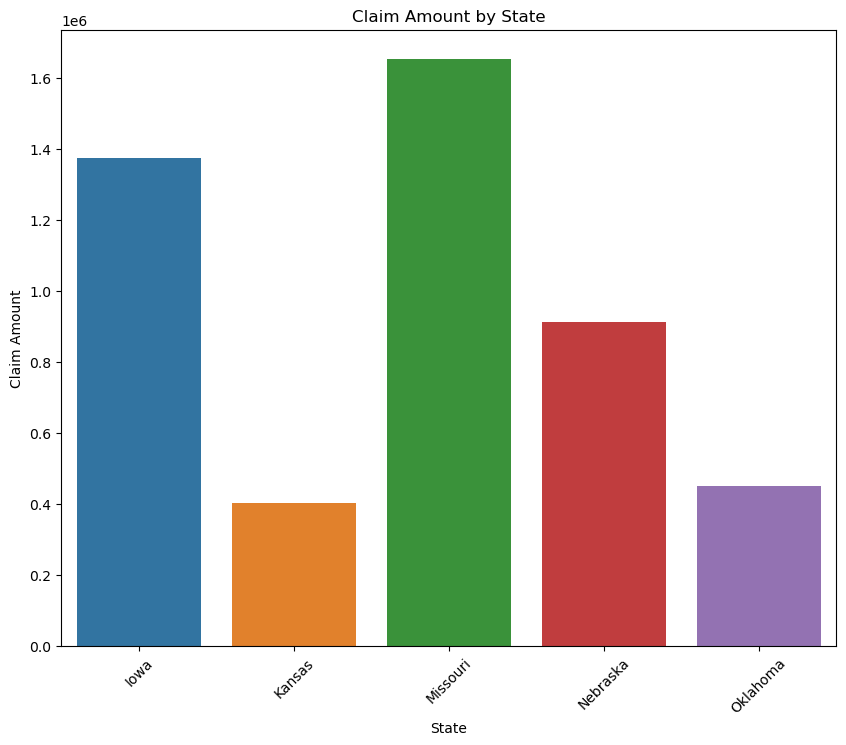

In [24]:
# Aggregate the total claim amount by state
claim_by_state = claim.groupby('State')['Claim Amount'].sum().reset_index()

# Create the bar plot
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.barplot(x='State', y='Claim Amount', data=claim_by_state)

# Set the title and axis labels
plt.title('Claim Amount by State')
plt.xlabel('State')
plt.ylabel('Claim Amount')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Display the plot
plt.show()


>### Observation:
     The observation from the bar plot is that the highest amount of claims paid is for the state of Missouri. This means that among all the states, Missouri has the highest claim amount in terms of the amount paid by the insurance company for the claims.

>countplot is used to display the count or frequency of categorical data, while a bar plot is used to compare and visualize the relationship between a categorical variable and a continuous variable.

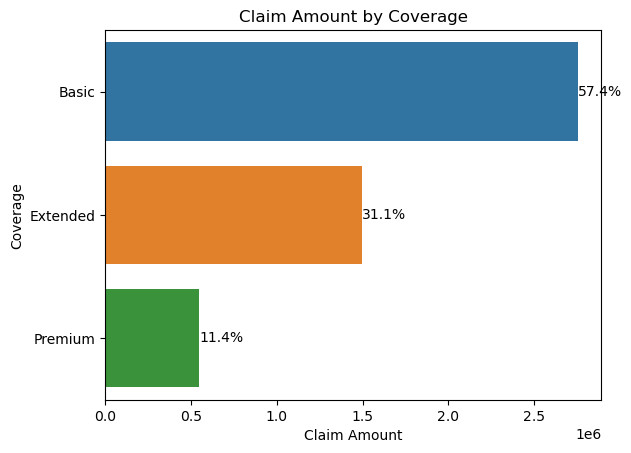

In [25]:
claim_by_coverage = claim.groupby('Coverage')['Claim Amount'].sum().reset_index()
total_claim_amount = claim['Claim Amount'].sum()
ax = sns.barplot(y='Coverage', x='Claim Amount', data=claim_by_coverage,orient='h')
# Add percentage labels to the bars
for p in ax.patches:
    width = p.get_width()
    percentage = (width / total_claim_amount) * 100
    ax.annotate(f'{percentage:.1f}%', (width, p.get_y() + p.get_height() / 2), ha='left', va='center')

plt.title('Claim Amount by Coverage')
plt.xlabel('Claim Amount')
plt.ylabel('Coverage')
plt.show()

>### Observation:
     The observation from the plot is that the coverage category "Basic" has incurred the highest claim amount.

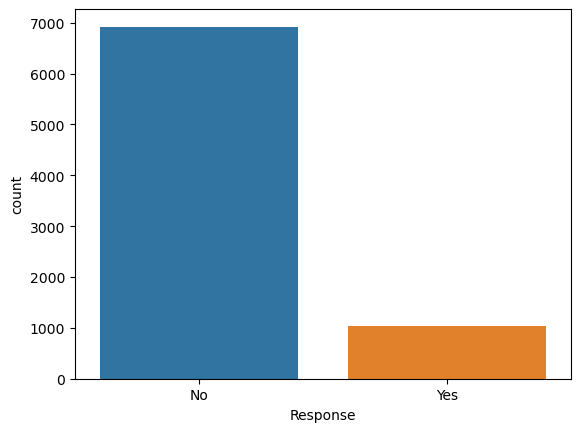

In [26]:
#plotting countplot for response
sns.countplot(claim['Response'])
plt.show()

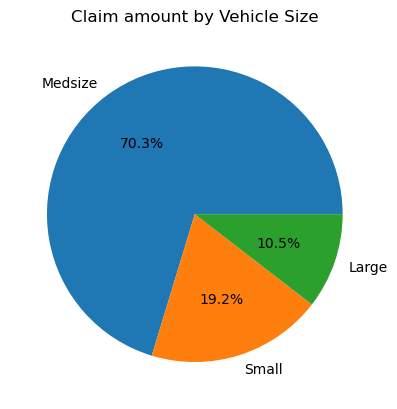

In [27]:
category_counts = claim['Vehicle Size'].value_counts()
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%')
plt.title('Claim amount by Vehicle Size')
plt.show()

>### It shows medsize vehicle holders claim is more than others

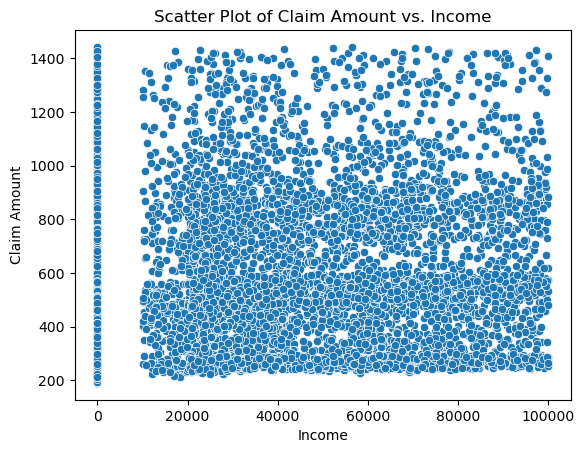

In [28]:
sns.scatterplot(x='Income', y='Claim Amount', data=claim)
plt.title('Scatter Plot of Claim Amount vs. Income')
plt.show()

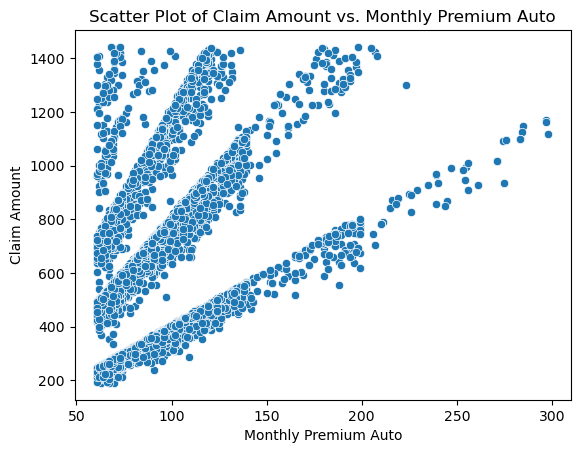

In [29]:
#scatterplot b/w total claim amount and monthly premium auto
sns.scatterplot(x='Monthly Premium Auto',y='Claim Amount',data=claim)
plt.title('Scatter Plot of Claim Amount vs. Monthly Premium Auto')
plt.show()

In [30]:
#getting the correlation among data
claim.corr()

,Claim Amount,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount
Claim Amount,1.000000,0.049805,0.433332,-0.008691,-0.004432,-0.033691,0.282445,0.222767
Income,0.049805,1.000000,-0.034447,-0.033111,-0.001168,0.005489,-0.012691,-0.376206
Monthly Premium Auto,0.433332,-0.034447,1.000000,0.001142,0.019480,-0.008715,-0.045509,0.602032
Months Since Last Claim,-0.008691,-0.033111,0.001142,1.000000,-0.047721,0.006950,0.004456,0.004912
Months Since Policy Inception,-0.004432,-0.001168,0.019480,-0.047721,1.000000,-0.003631,-0.012717,0.002537
Number of Open Complaints,-0.033691,0.005489,-0.008715,0.006950,-0.003631,1.000000,-0.004003,-0.011784
Number of Policies,0.282445,-0.012691,-0.045509,0.004456,-0.012717,-0.004003,1.000000,-0.021366
Total Claim Amount,0.222767,-0.376206,0.602032,0.004912,0.002537,-0.011784,-0.021366,1.000000


In [31]:
## Outlier treatment for Claim Amount

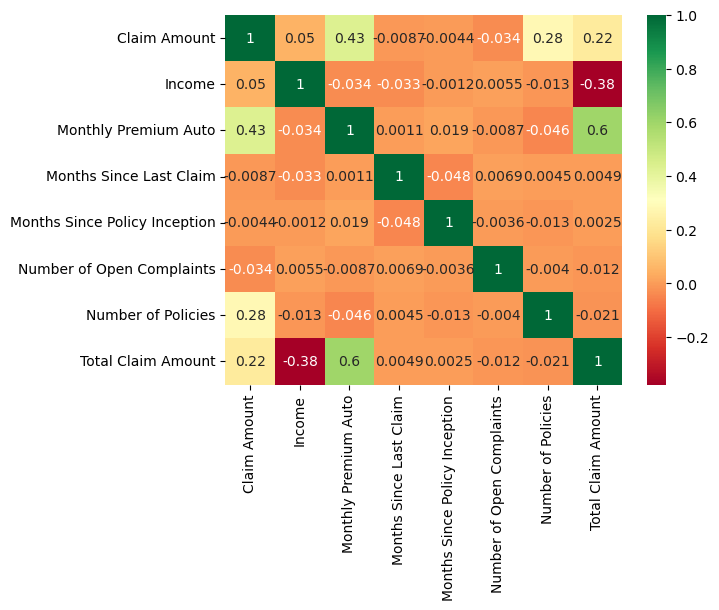

In [32]:
#plotting heatmap for corrlation for visual clarification
sns.heatmap(claim.corr(),annot=True,cmap="RdYlGn")
plt.show()

>### Observation:
- The "Claim Amount" variable has the highest correlation with "Monthly Premium Auto" (0.433) and a moderate correlation with "Number of Policies" (0.282) and "Total Claim Amount" (0.223).

- There is a weak positive correlation between "Claim Amount" and "Income" (0.050).

- "Income" has a negative correlation (-0.376) with "Total Claim Amount", indicating that higher income is associated with lower claim amounts.

- The remaining variables ("Months Since Last Claim", "Months Since Policy Inception", and "Number of Open Complaints") have very weak correlations with "Claim Amount".

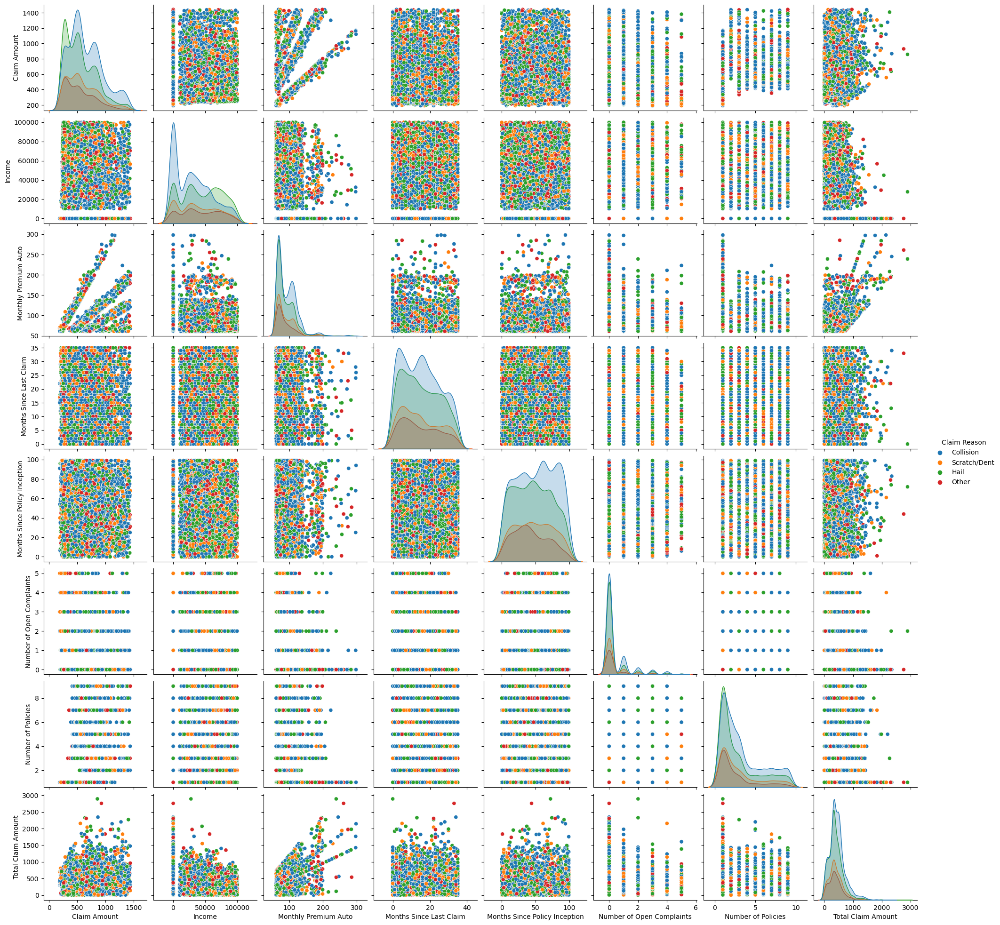

In [33]:
#pairplot for the data
sns.pairplot(claim,hue='Claim Reason')
plt.show()

In [34]:
from pivottablejs import pivot_ui
pivot_ui(claim)

>#### The pivottablejs library is a powerful tool for interactive data analysis in Python. It offers the pivot_ui function, which enables the creation of dynamic pivot tables. Pivot tables are useful for summarizing and aggregating data based on different dimensions, providing valuable insights into complex datasets.

### Statistical summary of data

In [35]:
claim.describe()

,Claim Amount,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount
count,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000,7950.000000
mean,603.135761,37627.571195,89.833585,15.049057,48.062642,0.394717,3.046667,418.023014
std,290.322486,30525.666327,29.643470,10.051202,27.963131,0.927581,2.488208,271.622539
min,189.800768,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007
25%,368.740475,0.000000,68.000000,6.000000,24.000000,0.000000,1.000000,264.487297
50%,538.949947,33859.000000,80.000000,14.000000,47.000000,0.000000,2.000000,369.968295
75%,798.487822,62390.750000,106.000000,23.000000,72.000000,0.000000,4.000000,537.600000
max,1442.989284,99981.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678


It shows the presence of outliers in most of the columns here,so we need to handle it

>### LabelEncoder:
 It is a preprocessing technique commonly used in machine learning to convert categorical variables into numerical representations. It assigns a unique numerical label to each unique category in the categorical variable.

In [36]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in claim.columns:
    if claim[col].dtypes=="object":
        claim[col]=le.fit_transform(claim[col])

In [37]:
#lets see the dataset structure now
claim.head()

,State,Claim Amount,Response,Coverage,Gender,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Claim Reason,Total Claim Amount,Vehicle Class,Vehicle Size
0,1,276.351928,0,0,0,56274,69,32,5,0,1,0,2,0,384.811147,5,1
1,3,697.953590,0,1,0,0,94,13,42,0,8,1,5,3,1131.464935,0,1
2,4,1288.743165,0,2,0,48767,108,18,38,0,2,1,5,0,566.472247,5,1
3,2,764.586183,0,0,1,0,106,18,65,0,7,0,1,0,529.881344,3,1
4,1,281.369258,0,0,1,43836,73,12,44,0,1,1,3,0,138.130879,0,1


>## Data Splitting:
The dataset was split into features (X) and the target variable (y). The data was further divided into training and testing sets using the train_test_split function from the scikit-learn library. This splitting allows us to train the models on a portion of the data and evaluate their performance on unseen data.

We have two columns claim amount and total claim amount,I am selecting claim amount as my target variable because it seems more feasible to select it from visualization above.

In [38]:
x=claim.drop('Claim Amount',axis=1)
y=claim['Claim Amount']

>### Defining 'random' function to determine random state:
The purpose of this function is to find the random state that yields the best performance (highest R-squared score) for a given algorithm when splitting the data into training and testing sets. By iterating over different random state values, it helps identify the random state that produces the most favorable results for the specific algorithm being evaluated.

In [39]:
def random(alg):
    r_state=0
    for r_score in range(43,101):
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=r_score)
        alg.fit(x_train,y_train)
        pred=alg.predict(x_test)
        r2scr=r2_score(y_test,pred)
        if r2scr > r_state:
            r_state=r2scr
            final_r=r_score
    print(r2scr,'at',final_r)

>### Defining 'model' function for algorithm operations:
The purpose of the model function is to evaluate a given machine learning algorithm (specified by the alg parameter) on a test dataset. It fits the algorithm on the training data, makes predictions on the test data, and computes various evaluation metrics such as mean squared error, mean absolute error, R2 score, and root mean squared error.

In [40]:
def model(alg):
    ml=alg
    ml.fit(x_train,y_train)
    pred=ml.predict(x_test)
    print('mean_squared_error=',mean_squared_error(y_test,pred))
    print('mean_absolute_error=',mean_absolute_error(y_test,pred))
    print('r2_score=',r2_score(y_test,pred))
    print('root_mean_squared_error=',np.sqrt(mean_squared_error(y_test,pred)))

>### Defining 'cross_val' function:
The purpose of the cross_val function is to perform cross-validation for a given machine learning algorithm (alg). It calculates and prints the cross-validation scores, the mean score, and the standard deviation of the scores.

In [41]:
def cross_val(alg):
    score=cross_val_score(alg,x,y,cv=5)
    print(score)
    print(score.mean())
    print(score.std())

>### Model Training and Evaluation:
Several regression models were selected to train and evaluate their performance on the training and testing sets. The models used include Linear Regression, Decision Tree, Random Forest, and Gradient Boosting Regressor. Evaluation metrics such as Mean Squared Error (MSE), Mean Absolute Error (MAE), and R2 score were computed for each model to assess their predictive accuracy.

##### ML approaches:
- Linear Regression
- Decision Tree
- Random Forest
- Gradient Boosting Regressor

## Linear Regression
- Linear Regression is a statistical modeling technique used to understand and quantify the relationship between a dependent variable and one or more independent variables. 
- It assumes a linear relationship between the dependent variable and the independent variables and aims to find the best-fitting line that represents this relationship. 
- The goal of linear regression is to estimate the coefficients of the line that minimize the difference between the predicted values and the actual values of the dependent variable. It is widely used in various fields for prediction, forecasting, and understanding the impact of independent variables on the dependent variable.

In [42]:
# using Linear regression
from sklearn.linear_model import LinearRegression
lm=LinearRegression()
random(lm)

0.29522387699412866 at 48


In [43]:
## Alternate Approach

In [44]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.33,random_state=51)
lm=LinearRegression()
linear_model=lm.fit(x_train,y_train)
print("Accuracy on train data : ",linear_model.score(x_train,y_train)*100)
print("Accuracy on test data : ",linear_model.score(x_test,y_test)*100)
y_pred=linear_model.predict(x_test)
print("Accuracy",r2_score(y_test, y_pred)*100)

Accuracy on train data :  29.98614791788038
Accuracy on test data :  27.199492254908087
Accuracy 27.199492254908087


>### cross_val_score:
This is a function in scikit-learn that performs cross-validation and returns the scores of a specified metric for each fold. It is a convenient way to evaluate the performance of a model using cross-validation.(https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html)

In [45]:
cross_val(lm)

[0.29581    0.26320887 0.31636934 0.29658377 0.26344781]
0.2870839566818214
0.020749510323495986


In [46]:
## Alternate Approach

In [47]:
cross_lm=cross_val_score(LinearRegression(),x,y,cv=3)
cross_lm

array([0.29043184, 0.30630861, 0.2666507 ])

In [48]:
np.average(cross_lm)*100

28.779704822611624

## Decision Tree Regressor:
- Decision Tree Regressor is a machine learning algorithm that belongs to the family of regression models. It is a predictive modeling technique used to predict a continuous target variable based on a set of independent variables or features.

In [49]:
#lets try for decison tree regressor
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
random(dtr)

0.9316858548333432 at 83


In [50]:
## Alternate Approach

In [51]:
decision_model=dtr.fit(x_train,y_train)
print("Accuracy on train data :",decision_model.score(x_train,y_train)*100)
print("Accuracy on test data : ",decision_model.score(x_test,y_test)*100)
y_pred=decision_model.predict(x_test)
print("Accuracy :",r2_score(y_test, y_pred)*100)

Accuracy on train data : 100.0
Accuracy on test data :  91.85173962632591
Accuracy : 91.85173962632591


In [52]:
cross_val(dtr)

[0.94140736 0.8955709  0.92430206 0.94462616 0.93237068]
0.9276554321176697
0.01755002631258223


In [53]:
cross_dtr=cross_val_score(DecisionTreeRegressor(),x,y,cv=3)
cross_dtr
np.average(cross_dtr)*100

93.09735105946034

>## Random Forest:
Random Forest Regression is a supervised machine learning algorithm that combines the principles of ensemble learning and decision tree regression. It is widely used for solving regression problems and making predictions based on multiple decision trees.

In [54]:
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor()

#getting n_estimators using gridsearchcv
parameters={'n_estimators':[10,100]}
grid=GridSearchCV(rfr,parameters,cv=5)
grid.fit(x,y)
grid.best_params_

{'n_estimators': 100}

In [55]:
rfr=RandomForestRegressor(n_estimators=100)
random(rfr)

0.9599730933820937 at 83


In [56]:
## Alternate approach

In [57]:
rf_model=rfr.fit(x_train,y_train)
print("Accuracy on train data :",rf_model.score(x_train,y_train)*100)
print("Accuracy on test data : ",rf_model.score(x_test,y_test)*100)
y_pred=rf_model.predict(x_test)
print("Accuracy :",r2_score(y_test, y_pred)*100)

Accuracy on train data : 99.46891333934418
Accuracy on test data :  95.9138698431406
Accuracy : 95.9138698431406


In [58]:
cross_val(rfr)

[0.96931245 0.95896628 0.96471713 0.95769103 0.96086344]
0.9623100661921098
0.004229339864498847


In [59]:
cross_rf=cross_val_score(RandomForestRegressor(n_estimators=100),x,y,cv=3)
cross_rf
np.average(cross_rf)*100

96.24315268001506

>## Gradient Boosting Regressor:
- Gradient Boosting Regressor is a machine learning algorithm that belongs to the ensemble learning family. It is a powerful regression technique that combines multiple weak prediction models (typically decision trees) to create a strong predictive model.
- The main advantages of Gradient Boosting Regressor include its ability to handle complex nonlinear relationships, handle missing values, and robustness against outliers.

In [60]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()

#getting best parameters using gridsearch
parameters={'learning_rate':[0.001,0.01,0.1,1],'n_estimators':[10,100,500]}
grid=GridSearchCV(gbr,parameters,cv=5)
grid.fit(x,y)
grid.best_params_

{'learning_rate': 0.1, 'n_estimators': 500}

In [61]:
gbr=GradientBoostingRegressor(n_estimators=100)
random(gbr)

0.9578384368380958 at 83


In [62]:
gbr_model=gbr.fit(x_train,y_train)
print("Accuracy on train data :",gbr_model.score(x_train,y_train)*100)
print("Accuracy on test data : ",gbr_model.score(x_test,y_test)*100)
y_pred=gbr_model.predict(x_test)
print("Accuracy :",r2_score(y_test, y_pred)*100)

Accuracy on train data : 96.6860186709587
Accuracy on test data :  95.88980681023848
Accuracy : 95.88980681023848


In [63]:
cross_val(gbr)

[0.96593056 0.96145013 0.96296673 0.95740666 0.95734179]
0.9610191735607753
0.0033067744112740003


In [64]:
cross_gbr=cross_val_score(GradientBoostingRegressor(n_estimators=100),x,y,cv=3)
cross_gbr
np.average(cross_gbr)*100

96.07042906133897

In [65]:
from tabulate import tabulate
classifiers = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting Regressor': GradientBoostingRegressor()
}

# Perform cross-validation and store the average accuracy results
accuracy_results = []
for clf_name, clf in classifiers.items():
    clf_scores = cross_val_score(clf, x, y, cv=3)
    average_accuracy = np.average(clf_scores) * 100
    accuracy_results.append([clf_name, average_accuracy])

# Convert the accuracy results to a DataFrame
accuracy_df = pd.DataFrame(accuracy_results, columns=['Model', 'Average Accuracy'])

# Print the DataFrame as a table
table = tabulate(accuracy_df, headers='keys', tablefmt='fancy_grid')
print(table)

╒════╤═════════════════════════════╤════════════════════╕
│    │ Model                       │   Average Accuracy │
╞════╪═════════════════════════════╪════════════════════╡
│  0 │ Linear Regression           │            28.7797 │
├────┼─────────────────────────────┼────────────────────┤
│  1 │ Decision Tree               │            92.9373 │
├────┼─────────────────────────────┼────────────────────┤
│  2 │ Random Forest               │            96.2518 │
├────┼─────────────────────────────┼────────────────────┤
│  3 │ Gradient Boosting Regressor │            96.0766 │
╘════╧═════════════════════════════╧════════════════════╛


>### Final Observation:

- Based on the analysis and evaluation of different regression models for predicting motor insurance claims, the Random Forest model stands out as the top performer. It achieves a high training accuracy of 99.46% and a test accuracy of 95.91%, indicating its ability to accurately predict claim amounts both on the data it was trained on and on new, unseen data.

- The Gradient Boosting Regressor model also demonstrates strong performance, with a training accuracy of 96.68% and a test accuracy of 95.88%. While it performs slightly lower than the Random Forest model, it still shows good predictive capability and generalization.

- Therefore, the final conclusion is that the Random Forest model is the recommended choice for predicting motor insurance claims.

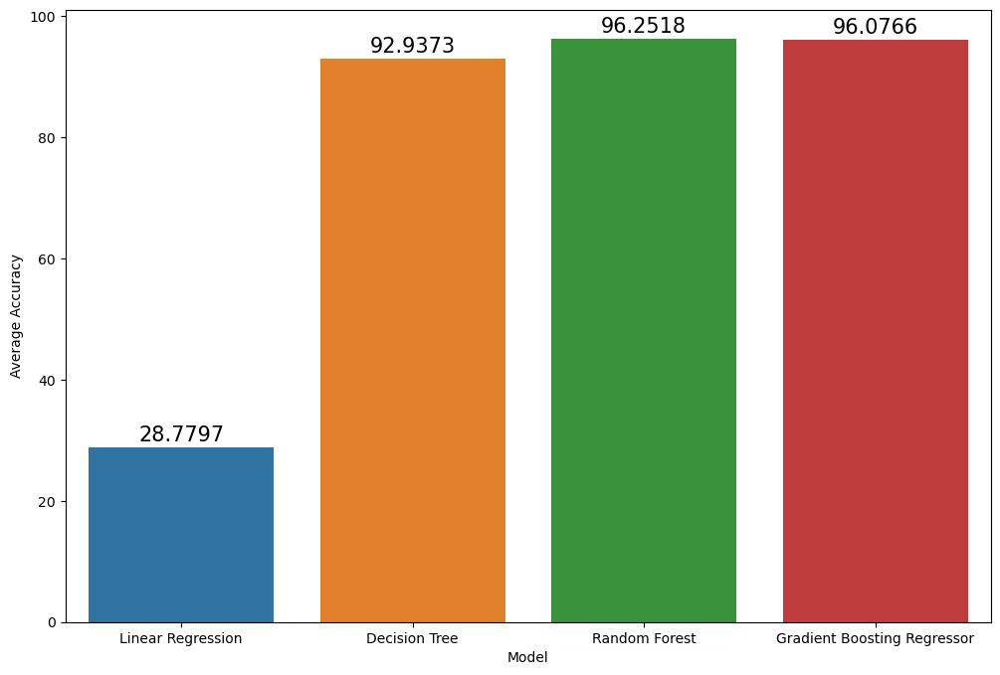

In [66]:
plt.subplots(figsize=(12,8))
ax=sns.barplot(x='Model',y="Average Accuracy",data=accuracy_df)
labels = round(accuracy_df["Average Accuracy"],4)
# add result numbers on barchart
for i, v in enumerate(labels):
    ax.text(i, v+1, str(v), horizontalalignment = 'center', size = 15, color = 'black')

In [67]:
## Quick Summary Using Pandas_profiling

In [68]:
import pandas_profiling as pp
report = claim.profile_report()
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [69]:
report.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Conclusion

- Dataset Overview: The dataset consists of various features related to Motor insurance claims, including customer information, policy details, claim amounts, and more.

- Data Preprocessing: The dataset was preprocessed by dropping unnecessary columns that do not contribute significantly to the claim prediction task. Categorical features were encoded using label encoding to convert them into numerical representations.

- Exploratory Data Analysis: Various graphs and subplots were plotted to gain insights into the relationships between different features and the target variable (claim amount). This helped in understanding the data patterns and identifying any correlations or trends.

- Outlier Treatment: Outliers in the 'Claim Amount' column were treated by removing rows where the claim amount was greater than or equal to 1443.274644. This step helps in improving the model's robustness and reducing the impact of extreme values.

- Model Selection: Different machine learning algorithms were evaluated for claim prediction. The performance of each model was assessed using train and test accuracy scores. Based on the evaluation, the Random Forest Regressor model emerged as the best-fit model, providing high accuracy on both the training and testing sets.

- Observation: In conclusion, the Random Forest Regressor model shows promising performance in predicting auto insurance claim amounts. It can be utilized for future claim predictions, allowing insurance companies to better assess the likelihood and amount of claims, thereby facilitating more accurate risk assessment and decision-making processes. However, it is essential to regularly monitor and update the model as new data becomes available to ensure its continued accuracy and reliability.

## Let's Predict the Claim Amount

In [70]:
from ipywidgets import interact, Dropdown

# Separate the features (X) and target variable (y)
x = claim[[ 'State', 'Coverage','Gender', 'Income',
       'Monthly Premium Auto', 'Months Since Last Claim',
       'Months Since Policy Inception', 'Number of Open Complaints',
       'Number of Policies', 'Policy Type', 'Policy', 'Claim Reason',
       'Vehicle Class', 'Vehicle Size']]
y = claim['Claim Amount']

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Define the models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting Regressor': GradientBoostingRegressor()
}

# Create a dropdown menu for model selection
model_dropdown = Dropdown(options=list(models.keys()), description='Select a model:')

# Create dropdown menus for each feature
feature_dropdowns = {}
for feature in x.columns:
    feature_values = list(x[feature].unique())
    feature_dropdowns[feature] = Dropdown(options=feature_values, description=feature)

# Define the function to handle user interaction
def predict_claim_amount(model_name, **kwargs):
    selected_model = models[model_name]
    selected_model.fit(x_train, y_train)
    user_input = {feature: kwargs[feature] for feature in kwargs}
    prediction = selected_model.predict([list(user_input.values())])[0]
    print(f'Predicted Claim Amount: {prediction}')

# Create an interactive widget using the predict_claim_amount function
interact(predict_claim_amount, model_name=model_dropdown, **feature_dropdowns)

interactive(children=(Dropdown(description='Select a model:', options=('Linear Regression', 'Decision Tree', '…

<function __main__.predict_claim_amount(model_name, **kwargs)>

>### Guided by: Shalini Kumari
>### Submitted by: Subhamita K